In [1]:
import torch

print(torch.__version__)
print(torch.version.cuda)

1.7.1
10.1


# 1. Image generation, translation and editing.

### Image translation

Firstly, we generate a FFHQ image which will be translated into anime faces. We perform layer swapping at layer2 to generate an anime face that resembles the FFHQ face

In [10]:
!python generate-image.py --gpu cuda:0 --n_img 1 --n_step 1 \
    --target networks/tl_fyp.pt,networks/NaverWebtoon_StructureLoss.pt \
    --swap --seed 4563541

Creating generator for networks/tl_fyp.pt
Creating generator for networks/NaverWebtoon_StructureLoss.pt
Beginning Program
Complete, end of program.


Visualise the result.

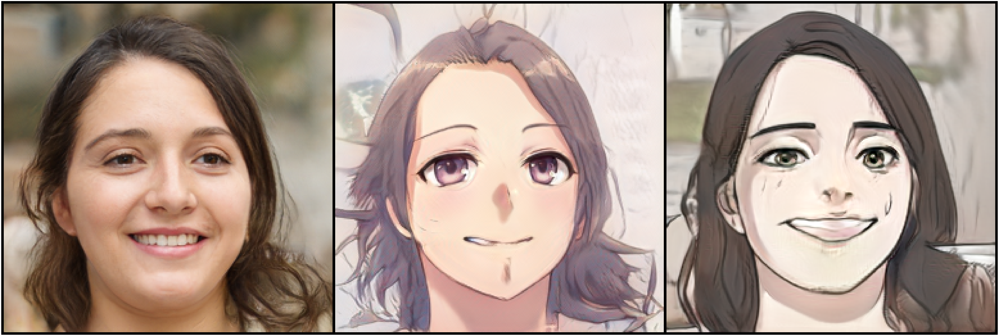

In [11]:
from PIL import Image
from utils import imshow

im = Image.open(f"./asset/results/out.png")
imshow(im, 100)

# 2. StyleCLIP 📎

> To change the face using StyleCLIP.

In [2]:
description = 'A smiling face with brown hair' #@param {type:"string"}

seed = 4428832 #@param {type:"slider", min:0, max:1000000, step:1}

latent_path = None #@param {type:"string"}

optimization_steps = 300 #@param {type:"number"}

l2_lambda = 0.004 #@param {type:"number"}

create_video = False #@param {type:"boolean"}

result_dir = "asset/results1" #@param {type:"string"}

device = 'cuda'

# -----------------------------
args = {
    "seed" : seed,
    "description": description,
    "ckpt": "./networks/ffhq256.pt",
    "ckpt2": "./networks/256Anime.pt",
    "stylegan_size": 256,
    "latent_dim" : 14,
    "lr_rampup": 0.05,
    "lr": 0.1,
    "step": optimization_steps,
    "l2_lambda": l2_lambda,
    "latent_path": latent_path,
    "truncation": 0.7,
    "save_intermediate_image_every": 1 if create_video else 20,
    "device" : "cuda",
    "results_dir": result_dir,
}


In [3]:
from run_optimization import main
from argparse import Namespace

final_result, latent_init1, latent_fin1 = main(Namespace(**args))

loss: 0.7573;: 100%|██████████| 300/300 [00:38<00:00,  7.87it/s]


In [ ]:
import torch

from model import Generator
from utils import imshow, tensor2image

device = 'cuda'

# ---------------
# Generator
# ---------------

# Generator1
network1='./networks/ffhq256.pt' 
network1 = torch.load(network1)

generator1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator1.load_state_dict(network1["g_ema"], strict=False)

trunc1 = generator1.mean_latent(4096)

# Generator2
Target_network = "256Anime" #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network2=f'./networks/{Target_network}.pt' 
network2 = torch.load(network2)

generator2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator2.load_state_dict(network2["g_ema"], strict=False)

trunc2 = generator2.mean_latent(4096)

# ---------------
# Interpolation
# ---------------

number_of_step = 6 #@param {type:"slider", min:0, max:30, step:1}
latent_interp = torch.zeros(number_of_step, latent_init1.shape[1], latent_init1.shape[2]).to(device)
strength = 1.5 #@param {type:"slider", min:1, max:3, step:0.25}
swap = True #@param {type:"boolean"}
swap_layer_num = 2 #@param {type:"slider", min:1, max:6, step:1}


with torch.no_grad():
    for j in range(number_of_step):

        latent_interp[j] = latent_init1 + strength * (latent_fin1-latent_init1) * float(j/(number_of_step-1))

        imgs_gen1, save_swap_layer = generator1([latent_interp],
                                input_is_latent=True,                                     
                                truncation=0.7,
                                truncation_latent=trunc1,
                                swap=swap, swap_layer_num=swap_layer_num,
                                randomize_noise=False)
        imgs_gen2, _ = generator2([latent_interp],
                                input_is_latent=True,                                     
                                truncation=0.7,
                                swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
                                truncation_latent=trunc2)

imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen1], dim=2)), 20)
imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen2], dim=2)), 20)

### **[ Example 2 ]**

I swapped the layer of low resolution to make the structure of the source image more visible.

In [5]:
seed = 456356 #@param {type:"slider", min:0, max:1000000, step:1}

description = 'A sad face with white hair.' #@param {type:"string"}

latent_path = None #@param {type:"string"}

optimization_steps = 300 #@param {type:"number"}

l2_lambda = 0.004 #@param {type:"number"}

create_video = False #@param {type:"boolean"}

result_dir = "asset/results2" #@param {type:"string"}

device = 'cuda'

# -----------------------------
args = {
    "seed" : seed,
    "description": description,
    "ckpt": "./networks/ffhq256.pt",
    "ckpt2": "./networks/256Anime.pt",
    "stylegan_size": 256,
    "latent_dim" : 14,
    "lr_rampup": 0.05,
    "lr": 0.1,
    "step": optimization_steps,
    "l2_lambda": l2_lambda,
    "latent_path": latent_path,
    "truncation": 0.7,
    "save_intermediate_image_every": 1 if create_video else 20,
    "device" : "cuda",
    "results_dir": result_dir,
}

In [6]:
from run_optimization import main
from argparse import Namespace

final_result, latent_init2, latent_fin2 = main(Namespace(**args))

loss: 0.7856;: 100%|██████████| 300/300 [00:37<00:00,  8.00it/s]


In [ ]:
import torch

from model import Generator
from utils import imshow, tensor2image

device = 'cuda'

# ---------------
# Generator
# ---------------

# Generator1
network1='./networks/ffhq256.pt' 
network1 = torch.load(network1)

generator1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator1.load_state_dict(network1["g_ema"], strict=False)

trunc1 = generator1.mean_latent(4096)

# Generator2
Target_network = "256Anime" #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network2 = f'./networks/{Target_network}.pt' 
network2 = torch.load(network2)

generator2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator2.load_state_dict(network2["g_ema"], strict=False)

trunc2 = generator2.mean_latent(4096)

# ---------------
# Interpolation
# ---------------

number_of_step = 10 #@param {type:"slider", min:0, max:10, step:1}
latent_interp = torch.zeros(number_of_step, latent_init2.shape[1], latent_init2.shape[2]).to(device)

strength = 1.25 #@param {type:"slider", min:1, max:3, step:0.25}
swap = True #@param {type:"boolean"}
swap_layer_num = 1 #@param {type:"slider", min:1, max:6, step:1}


with torch.no_grad():
    for j in range(number_of_step):

        latent_interp[j] = latent_init2 + strength * (latent_fin2-latent_init2) * float(j/(number_of_step-1))

        imgs_gen1, save_swap_layer = generator1([latent_interp],
                                input_is_latent=True,                                     
                                truncation=0.7,
                                truncation_latent=trunc1,
                                swap=swap, swap_layer_num=swap_layer_num,
                                randomize_noise=False)
        imgs_gen2, _ = generator2([latent_interp],
                                input_is_latent=True,                                     
                                truncation=0.7,
                                swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
                                truncation_latent=trunc2)
        
imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen1], dim=2)), 20)
imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen2], dim=2)), 20)

# 3. Encode image

Project your image with a late space and run it !🎉

Place image to project in image folder and rename it to input

In [1]:
# Perform image alignment
!python align-image.py --s ./image/ --d ./aligned-image/ --type ffhq

Aligning image yshtola.jpg
Aligning image input.jpg
Aligning image test.jpg
Aligning image swift.jpg
DONE


(256, 256)


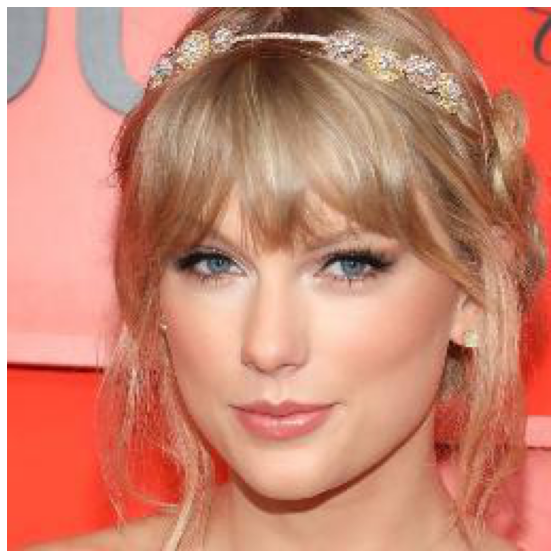

In [1]:
from PIL import Image
from utils import imshow

image_name = 'swift'
image_file_name = f'./aligned-image/align-{image_name}.jpg'
im = Image.open(f"{image_file_name}")
print(im.size)
im = im.resize((256,256))
im.save(f"{image_file_name}")

imshow(im,10) # original image

In [2]:
# Project your own image and Make Eigenvector of latent spaces (by pretrained model)
# modify file name under --files to target image
!python projector.py --ckpt=./networks/ffhq256.pt --factor='networks/tl_fyp_factor' --e_ckpt=./networks/encoder_ffhq.pt \
                            --files=./aligned-image/align-swift.jpg 

Setting up Perceptual loss...
Loading model from: /mnt/4TB/tongliang/Cartoon-StyleGan2/lpips/weights/v0.1/vgg.pth
...[net-lin [vgg]] initialized
...Done
perceptual: 0.2388; noise regularize: 0.0549; reconstruction: 0.0323; mse_img: 0


In [3]:
import torch

project = torch.load("./project.pt")
# project_result = project[image_name[0]]['latent']
project_result = project['align-swift']['latent']
torch.save(project_result, './latent.pt')

project = torch.load('./latent.pt').cuda()
print(project.shape)

torch.Size([1, 14, 512])


Style clip optimisation

In [5]:
seed = 1448634 #@param {type:"slider", min:0, max:1000000, step:1}

target_network = 'tl_fyp' #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
description = '' #@param {type:"string"}

latent_path = "./latent.pt" #@param {type:"string"}

optimization_steps = 300 #@param {type:"number"}

l2_lambda = 0.001 #@param {type:"number"}

create_video = False #@param {type:"boolean"}

result_dir = "asset/results3" #@param {type:"string"}

device = 'cuda'

# -----------------------------
args = {
    "seed" : seed,
    "description": description,
    "ckpt": "./networks/ffhq256.pt",
    "ckpt2": f"./networks/{target_network}.pt",
    "stylegan_size": 256,
    "latent_dim" : 14,
    "lr_rampup": 0.05,
    "lr": 0.002,
    "step": optimization_steps,
    "l2_lambda": l2_lambda,
    "latent_path": latent_path,
    "truncation": 0.7,
    "save_intermediate_image_every": 1 if create_video else 20,
    "device" : device,
    "results_dir": result_dir,
}

# -----------------------------

from run_optimization import main
from argparse import Namespace

final_result, latent_init3, latent_fin3 = main(Namespace(**args))


loss: 0.0000;: 100%|██████████| 300/300 [00:18<00:00, 15.82it/s]


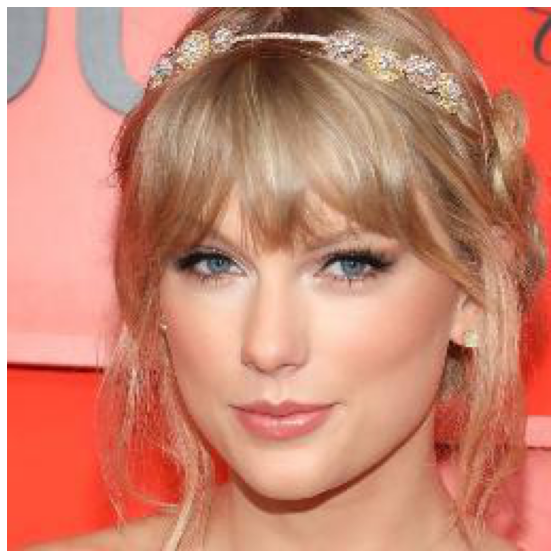

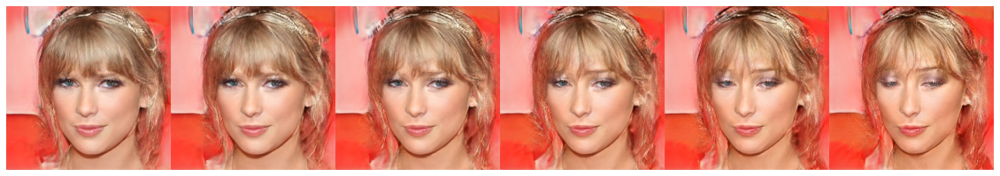

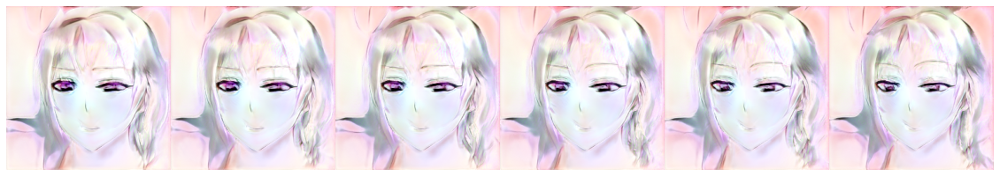

In [5]:
import torch

from model import Generator
from utils import imshow, tensor2image

device = 'cuda'

# Generator1
network1='./networks/ffhq256.pt' 
network1 = torch.load(network1)

generator1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator1.load_state_dict(network1["g_ema"], strict=False)

trunc1 = generator1.mean_latent(4096)

# Generator2
Target_network = "tl_fyp" #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network2=f'./networks/{Target_network}.pt' 
network2 = torch.load(network2)

generator2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator2.load_state_dict(network2["g_ema"], strict=False)

trunc2 = generator2.mean_latent(4096)

number_of_step = 1 #@param {type:"slider", min:0, max:10, step:1}
# latent_interp = torch.zeros(number_of_step, latent_init3.shape[1], latent_init3.shape[2]).to(device)

sample_z_style = torch.randn(number_of_step, 512, device=device)
strength = 2 #@param {type:"slider", min:1, max:5, step:0.5}
swap = True #@param {type:"boolean"}
swap_layer_num = 2 #@param {type:"slider", min:1, max:6, step:1}

eigvec = torch.load(f'./networks/tl_fyp_factor.pt')["eigvec"].to(device)

index = [53]
degree = 6

real_imgs = []
fake_imgs = []

with torch.no_grad():
    for deg in range(degree):
        direction = []
        for eg in range(len(index)):
            direction.append(deg * eigvec[:, index[eg]].unsqueeze(0))
        direction = sum(direction)

        for j in range(number_of_step):

            imgs_gen1, save_swap_layer = generator1([project + direction],
                                    input_is_latent=True,                                     
                                    truncation=0.7,
                                    truncation_latent=trunc1,
                                    return_latents=False,
                                    swap=swap,
                                    swap_layer_num=swap_layer_num,
                                    randomize_noise=True)

            imgs_gen2, _ = generator2([project + direction],
                                    input_is_latent=True,                                     
                                    truncation=0.7,
                                    truncation_latent=trunc2,
                                    swap=swap,
                                    swap_layer_num=swap_layer_num,
                                    swap_layer_tensor=save_swap_layer,
                                    randomize_noise=True,
                                    )
            real_imgs.append(imgs_gen1)
            fake_imgs.append(imgs_gen2)

    imshow(im,10) # original image
    imshow(tensor2image(torch.cat([img_gen for img_gen in real_imgs], dim=3)), 20)
    imshow(tensor2image(torch.cat([img_gen for img_gen in fake_imgs], dim=3)), 20)

### Encoding Anime Image

In [ ]:
# Perform image alignment
!python align-image.py --s ./image/ --d ./aligned-image/ --type anime

(256, 256)


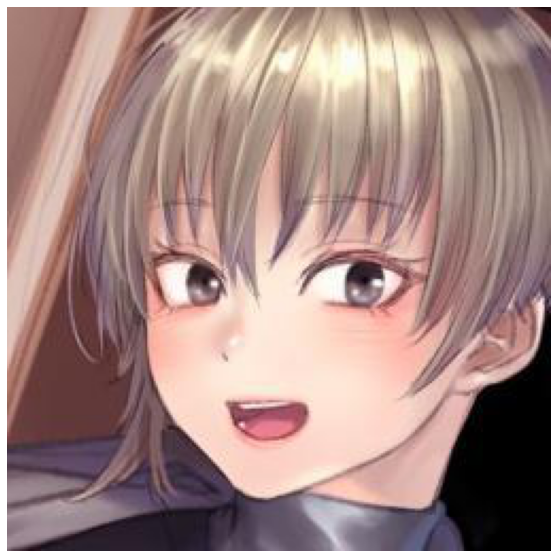

In [3]:
from PIL import Image
from utils import imshow

image_name = 'anime'
image_file_name = f'./aligned-image/align-{image_name}.jpg'
im = Image.open(f"{image_file_name}")
print(im.size)
im = im.resize((256,256))
im.save(f"{image_file_name}")

imshow(im,10) # original image

In [4]:
# Project your own image and Make Eigenvector of latent spaces (by pretrained model)
# modify file name under --files to target image
!python projector.py --ckpt=./networks/tl_fyp.pt --factor='networks/tl_fyp_factor' --e_ckpt=./networks/encoder_anime.pt \
                            --files=./aligned-image/align-anime.jpg 

Setting up Perceptual loss...
Loading model from: /mnt/4TB/tongliang/Cartoon-StyleGan2/lpips/weights/v0.1/vgg.pth
...[net-lin [vgg]] initialized
...Done
perceptual: 0.2385; noise regularize: 0.1153; reconstruction: 0.0384; mse_img: 0


In [6]:
import torch

project = torch.load("./project.pt")
# project_result = project[image_name[0]]['latent']
# change the first key to target image name
project_result = project['align-anime']['latent']
torch.save(project_result, './latent.pt')

project = torch.load('./latent.pt').cuda()
print(project.shape)

torch.Size([1, 14, 512])


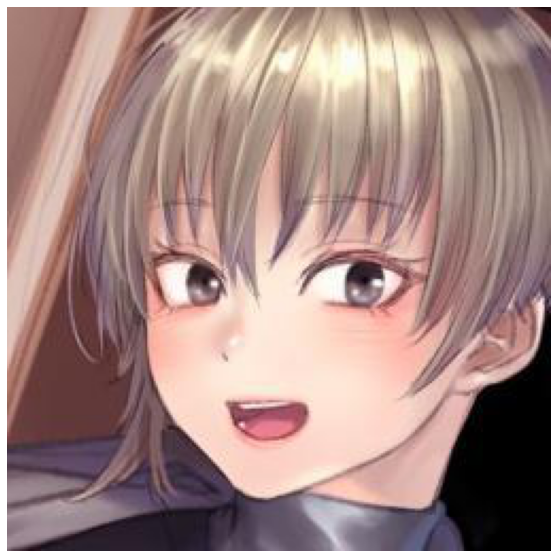

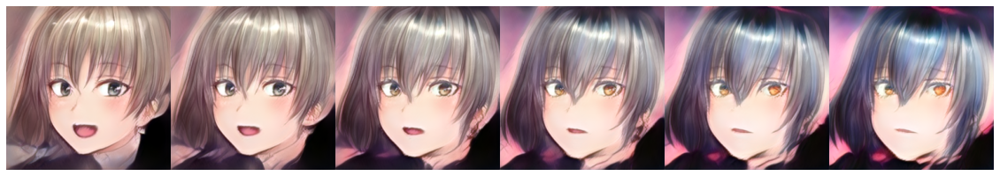

In [21]:
import torch
import PIL.Image as pilimg

from model import Generator
from utils import imshow, tensor2image
from torchvision.utils import make_grid
from IPython.display import Image

device = 'cuda'
outdir = 'results'
# Target Generator
Target_network = "tl_fyp" #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network2=f'./networks/{Target_network}.pt' 
network2 = torch.load(network2)

generator2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator2.load_state_dict(network2["g_ema"], strict=False)

trunc2 = generator2.mean_latent(4096)

number_of_step = 1 #@param {type:"slider", min:0, max:10, step:1}
swap = False #@param {type:"boolean"}

eigvec = torch.load(f'./networks/tl_fyp_factor.pt')["eigvec"].to(device)

index = [14, 30]
degree = 6

images = []
fake_imgs = []

with torch.no_grad():
    for deg in range(degree):
        direction = []
        for eg in range(len(index)):
            direction.append(deg * eigvec[:, index[eg]].unsqueeze(0))
        direction = sum(direction)

        for j in range(number_of_step):

            imgs_gen2, _ = generator2([project + direction],
                                    input_is_latent=True,                                     
                                    truncation=0.7,
                                    truncation_latent=trunc2,
                                    swap=swap,
                                    randomize_noise=True,
                                    )
            fake_imgs.append(imgs_gen2)
        grid = make_grid(torch.cat(fake_imgs, 0),
                        nrow=1,
                        normalize=True,
                        range=(-1,1),
                        )
        ndarr = grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy()
        images.append(pilimg.fromarray(ndarr))
    
    imshow(im,10) # original image
    imshow(tensor2image(torch.cat([img_gen for img_gen in fake_imgs], dim=3)), 20) # edited image

    images[0].save(f'./asset/{outdir}/edit-anime.gif', save_all=True, append_images=images[1:], loop=0, duration=100)
    Image(open(f'./asset/{outdir}/edit-anime.gif','rb').read())

# Style Mixing

Inspired by style mixing, I mixed style vectors of two images. Just mixing two different images with different feelings creates a high-quality image.

In [ ]:
#@title { display-mode: "form", run: "auto"}


import torch

from model import Generator
from utils import imshow, tensor2image

device = 'cuda'
Target_network = "NaverWebtoon_StructureLoss" #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
swap = True #@param {type:"boolean"}
save_swap_layer = 2 #@param {type:"slider", min:1, max:6, step:1}

# ---------------
# Generator
# ---------------

# Generator1
network1='./networks/ffhq256.pt' 
network1 = torch.load(network1)

generator1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator1.load_state_dict(network1["g_ema"], strict=False)

trunc1 = generator1.mean_latent(4096)

# latent1
seed1 = 273056 #@param {type:"slider", min:0, max:1000000, step:1}
torch.manual_seed(seed1)
latent1 = torch.randn(1, 14, 512, device=device)
latent1 = generator1.get_latent(latent1)


# Generator2
network2=f'./networks/{Target_network}.pt' 
network2 = torch.load(network2)

generator2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
generator2.load_state_dict(network2["g_ema"], strict=False)

trunc2 = generator2.mean_latent(4096)

# latent2
seed2 = 152577 #@param {type:"slider", min:0, max:1000000, step:1}
torch.manual_seed(seed2)
latent2 = torch.randn(1, 14, 512, device=device)
latent2 = generator2.get_latent(latent2)

# ---------------
# Interpolation
# ---------------

number_of_step = 6 #@param {type:"slider", min:0, max:10, step:1}
latent_interp = torch.zeros(number_of_step, latent1.shape[1], latent1.shape[2]).to(device)
swap_layer_num = 2 #@param {type:"slider", min:1, max:6, step:1}


with torch.no_grad():
    for j in range(number_of_step):

        latent_interp[j] = latent1 + (latent2-latent1) * float(j/(number_of_step-1))

        imgs_gen1, save_extract_layer = generator1([latent_interp],
                                input_is_latent=True,                                     
                                truncation=0.7,
                                truncation_latent=trunc1,
                                swap=swap, swap_layer_num=swap_layer_num,
                                )
                                
        imgs_gen2, _ = generator2([latent_interp],
                                input_is_latent=True,                                     
                                truncation=0.7,
                                truncation_latent=trunc2,
                                swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
                                )

imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen1], dim=2)), 20)
imshow(tensor2image(torch.cat([img_gen for img_gen in imgs_gen2], dim=2)), 20)

In [ ]:
import torch

from model import Generator
from utils import imshow, tensor2image
from random import randrange

device = 'cuda:1'
truncation = 0.7 

target_network ="256Anime_FS_SL_152000" #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
swap = True #@param {type:"boolean"}
swap_layer_num = 2 #@param {type:"slider", min:1, max:6, step:1}
# ----------------------
# Source Images (FFHQ)
# ----------------------

network1='./networks/ffhq256.pt' 
network1 = torch.load(network1, map_location='cpu')

# Genearator1
g1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g1.load_state_dict(network1["g"], strict=False)
g1.to(device)
trunc1 = g1.mean_latent(4096)

# latent1
seed1 = randrange(1000000) #@param {type:"slider", min:0, max:1000000, step:1}
torch.manual_seed(seed1)
r_latent1 = torch.randn(1, 14, 512, device=device)
latent1 = g1.get_latent(r_latent1)

# latent2
seed2 = randrange(1000000) #@param {type:"slider", min:0, max:1000000, step:1}
torch.manual_seed(seed2)
r_latent2 = torch.randn(1, 14, 512, device=device)
latent2 = g1.get_latent(r_latent2)

# latent mixing
latent_mixing1 =  12 #@param {type:"slider", min:0, max:15, step:1}
latent_mixing2 = 12 #@param {type:"slider", min:0, max:15, step:1}

latent3 = torch.cat([latent1[:,:latent_mixing1,:], latent2[:,latent_mixing1:latent_mixing2,:], latent1[:,latent_mixing2:,:]], dim = 1)
# latent4 = torch.cat([latent1[:,:,:latent_mixing2], latent2[:,:,latent_mixing2:]], dim = 2)

# Latent !
latent = torch.cat([latent1, latent2, latent3], dim = 0)

# generate image
img1, save_swap_layer = g1(
    [latent],
    truncation=truncation,
    truncation_latent=trunc1,
    swap=swap, swap_layer_num=swap_layer_num,
    input_is_latent=True,
)

# =================================================

# ----------------------
# Target Images (Cartoon)
# ----------------------

network2 =f'./networks/{target_network}.pt'
#network2 =f'./expr/checkpoints/{target_network}.pt'
network2 = torch.load(network2, map_location='cpu')

# Genearator2
g2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g2.load_state_dict(network2["g"], strict=False)
g2.to(device)
trunc2 = g2.mean_latent(4096)

# generate image

img2, _ = g2(
    [latent],
    input_is_latent=True,
    truncation=truncation,
    truncation_latent=trunc2,
    swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
)

# =================================================

# Show Image

ffhq = torch.cat([img1[0], img1[1], img1[2]], dim=2)
cartoon = torch.cat([img2[0], img2[1], img2[2]], dim=2)

imshow(tensor2image(torch.cat([ffhq, cartoon], dim = 1)), 15)

### Make A Video 📹

In [12]:
#@title  { run: "auto" }

# Save Image
import torch
import os
from utils import make_image
from torchvision.utils import save_image, make_grid
import PIL.Image as pilimg
from model import Generator

device = 'cuda'
truncation = 0.7 

target_network = 'Romance101' #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']

# ----------------------
# Source Images (FFHQ)
# ----------------------


network1='./networks/ffhq256.pt' 
network1 = torch.load(network1)

# Genearator1
g1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g1.load_state_dict(network1["g"], strict=False)
trunc1 = g1.mean_latent(4096)

# latent1
seed1 = 627356 #@param {type:"slider", min:0, max:1000000, step:1}
torch.manual_seed(seed1)
r_latent1 = torch.randn(1, 14, 512, device=device)
latent1 = g1.get_latent(r_latent1)

# latent2
seed2 = 159972 #@param {type:"slider", min:0, max:1000000, step:1}
torch.manual_seed(seed2)
r_latent2 = torch.randn(1, 14, 512, device=device)
latent2 = g1.get_latent(r_latent2)

# latent mixing
latent_mixing1 = 1 #@param {type:"slider", min:0, max:14, step:1}
latent_mixing2 = 419 #@param {type:"slider", min:0, max:512, step:1}

latent3 = torch.cat([latent1[:,:latent_mixing1,:], latent2[:,latent_mixing1:,:]], dim = 1)
latent4 = torch.cat([latent1[:,:,:latent_mixing2], latent2[:,:,latent_mixing2:]], dim = 2)

# Latent !
latent = torch.cat([latent1, latent2, latent3, latent4], dim = 0)


# ----------------------
# Target Images (Cartoon)
# ----------------------

network2=f'./networks/{target_network}.pt'
network2 = torch.load(network2)

# Genearator2
g2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g2.load_state_dict(network2["g"], strict=False)
trunc2 = g2.mean_latent(4096)




In [ ]:
#@markdown Latent Mixing1

if not os.path.isdir('./asset/latent_mix1'):
   os.makedirs('./asset/latent_mix1', exist_ok=True)

for latent_mixing1 in range(15):
    latent3 = torch.cat([latent1[:,:latent_mixing1,:], latent2[:,latent_mixing1:,:]], dim = 1)
    
    latent = torch.cat([latent2, latent1, latent3], dim = 0)

    img1, mix_layer = g1(
        [latent],
        input_is_latent=True,
        truncation=truncation,
        truncation_latent=trunc1,
        extract_layer=True, extract_layer_num=1,
    )
    img2, _ = g2(
        [latent],
        input_is_latent=True,
        truncation=truncation,
        truncation_latent=trunc2,
        extract_layer=False, extract_layer_num=1, put_layer = mix_layer,
    )

    img_name = "./asset/latent_mix1/latent_mixing1_" + str(latent_mixing1) + ".png"
    grid = make_grid(torch.cat([img1, img2], dim=0),
                    nrow=3,
                    normalize=True,
                    range=(-1,1))

    ndarr = grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy()
    im = pilimg.fromarray(ndarr)
    im.save(img_name)



In [ ]:
#@title  { run: "auto" }


# =====================================

from PIL import Image
import cv2 
from torchvision.utils import save_image
import PIL.Image as pilimg
import numpy as np

img_name = "/content/Cartoon-StyleGan2/asset/latent_mix1/latent_mixing1_0.png"
image = Image.open(img_name)

frameSize = image.size
FPS = 3 #@param {type:"slider", min:0, max:10, step:1}
fourcc = cv2.VideoWriter_fourcc(*'XVID')

video = cv2.VideoWriter('/content/Cartoon-StyleGan2/asset/latent_mix1/latent_mixing1.mp4', fourcc, float(FPS), frameSize)

for i in range(15):

    im = pilimg.open("/content/Cartoon-StyleGan2/asset/latent_mix1/latent_mixing1_" + str(i) + ".png")
    np_img = np.asarray(im)

    frame = cv2.cvtColor(np_img, cv2.COLOR_RGB2BGR)
    video.write(frame)

video.release()
#--------------------------
# Show a Interpolation Video in Colab
#--------------------------

from IPython.display import HTML
from base64 import b64encode
mp4 = open('/content/Cartoon-StyleGan2/asset/latent_mix1/latent_mixing1.mp4','rb').read()

data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=700 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
#@markdown Latent Mixing2

if not os.path.isdir('./asset/latent_mix2'):
   os.makedirs('./asset/latent_mix2', exist_ok=True)

for latent_mixing2 in range(64):
    latent3 = torch.cat([latent1[:,:,:latent_mixing2*8], latent2[:,:,latent_mixing2*8:]], dim = 2)
    
    latent = torch.cat([latent2, latent1, latent3], dim = 0)

    img1, mix_layer = g1(
        [latent],
        input_is_latent=True,
        truncation=truncation,
        truncation_latent=trunc1,
        extract_layer=True, extract_layer_num=1,
    )
    img2, _ = g2(
        [latent],
        input_is_latent=True,
        truncation=truncation,
        truncation_latent=trunc2,
        extract_layer=False, extract_layer_num=1, put_layer = mix_layer,
    )

    img_name = "/content/Cartoon-StyleGan2/asset/latent_mix2/latent_mixing2_" + str(latent_mixing2) + ".png"
    grid = make_grid(torch.cat([img1, img2], dim=0),
                    nrow=3,
                    normalize=True,
                    range=(-1,1))

    ndarr = grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy()
    im = pilimg.fromarray(ndarr)
    im.save(img_name)



In [ ]:
#@title  { run: "auto" }


# =====================================

from PIL import Image
import cv2 
from torchvision.utils import save_image
import PIL.Image as pilimg
import numpy as np

img_name = "/content/Cartoon-StyleGan2/asset/latent_mix2/latent_mixing2_0.png"
image = Image.open(img_name)

frameSize = image.size
FPS = 15 #@param {type:"slider", min:0, max:50, step:1}
fourcc = cv2.VideoWriter_fourcc(*'XVID')

video = cv2.VideoWriter('/content/Cartoon-StyleGan2/asset/latent_mix2/latent_mixing2.mp4', fourcc, float(FPS), frameSize)

for i in range(64):

    im = pilimg.open("/content/Cartoon-StyleGan2/asset/latent_mix2/latent_mixing2_" + str(i) + ".png")
    np_img = np.asarray(im)

    frame = cv2.cvtColor(np_img, cv2.COLOR_RGB2BGR)
    video.write(frame)

video.release()
#--------------------------
# Show a Interpolation Video in Colab
#--------------------------

from IPython.display import HTML
from base64 import b64encode
mp4 = open('/content/Cartoon-StyleGan2/asset/latent_mix2/latent_mixing2.mp4','rb').read()

data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=700 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
import torch
from model import Generator
from utils import imshow, tensor2image

device = 'cuda'
truncation = 0.7 

save_latent = False #@param {type:"boolean"}
target_network ="NaverWebtoon_StructureLoss" #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
n_sample = 6 #@param {type:"slider", min:1, max:10, step:1}
# latent mixing
latent_mixing1 = 6 #@param {type:"slider", min:0, max:14, step:1}


# ----------------------
# Source Images (FFHQ)
# ----------------------

network1=f'./networks/{target_network}.pt' 
network1 = torch.load(network1)

# Genearator1
g1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g1.load_state_dict(network1["g"], strict=False)
trunc1 = g1.mean_latent(4096)

# latent1
if not save_latent:
  r_latent1 = torch.randn(n_sample, 14, 512, device=device)
  latent1 = g1.get_latent(r_latent1)

# generate image
img1, _ = g1(
    [latent1],
    truncation=truncation,
    truncation_latent=trunc1,
    input_is_latent=True,
)

images = [torch.cat([img for img in img1], 2)]


for i in range(n_sample):
  latent = latent1[i].unsqueeze(0).repeat(n_sample, 1, 1)
  latent2 = torch.cat([latent[:,:latent_mixing1,:], latent1[:,latent_mixing1:,:]], dim = 1)
  
  # generate image
  img1, _ = g1(
      [latent2],
      truncation=truncation,
      truncation_latent=trunc1,
      input_is_latent=True,
  )

  images.append(torch.cat([img for img in img1], 2))

imshow(tensor2image(torch.cat([img for img in images], 1)), 20)

# Closed-Form Factorization

In [5]:
!python apply_factor.py --index=2 --degree=25 --seed=648963 --n_sample=5 \
                        --ckpt='./networks/ffhq256.pt' --device='cuda:1' --ckpt2='./expr_feature_discriminators/checkpoints/070000.pt' \
                        --factor='./factor.pt' --outdir='./asset/results-sefa' --video 

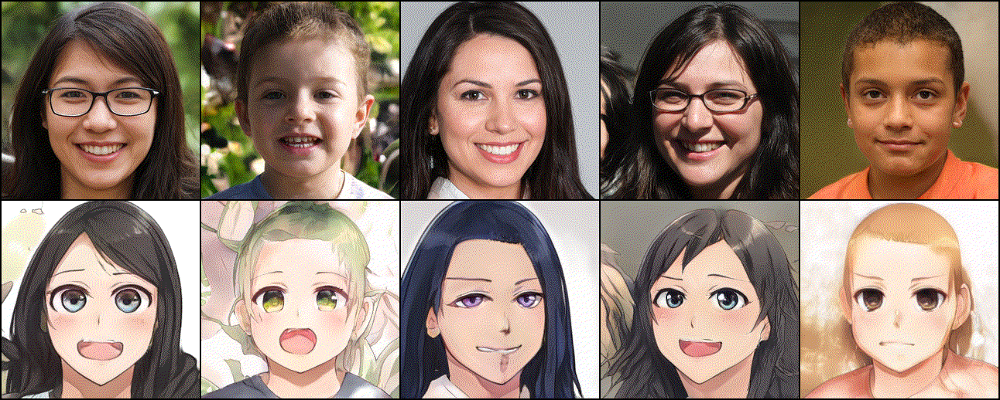

In [6]:
from IPython.display import Image
Image(open('./asset/results-sefa/video.gif','rb').read())

In [3]:
# @title { display-mode: "form", run: "auto"}

import torch
import cv2 
import numpy as np
from torchvision.utils import save_image, make_grid
from utils import imshow, tensor2image
import PIL.Image as pilimg

from model import Generator


device='cuda:1'
n_sample=5
truncation = 0.7
trunc = 0.7

# Eigen-Vector
factor='./factor.pt'
eigvec = torch.load(factor)["eigvec"].to(device)


# =============================================

# Genearaotr1
network1 = 'ffhq256' #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network1=f'./networks/{network1}.pt' 
network1 = torch.load(network1)

g1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g1.load_state_dict(network1["g_ema"], strict=False)


# Generator2
network2 = './expr_feature_discriminators/checkpoints/170000.pt' #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network2 = torch.load(network2)

g2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g2.load_state_dict(network2["g_ema"], strict=False)

# latent
seed = 177838 #@param {type:"slider", min:0, max:1000000, step:1}
torch.manual_seed(seed)
latent = torch.randn(n_sample, 14, 512, device=device)
latent = g1.get_latent(latent)

# latent direction & scalar
index=19 #@param {type:"slider", min:0, max:512, step:1}
degree=15 #@param {type:"slider", min:0, max:30, step:1}


# =============================================

# directory to save image
outdir = 'result-sefa' #@param {type:"string"}
if not os.path.isdir(f'{outdir}'):
   os.makedirs(f'./asset/{outdir}', exist_ok=True)

imgs = []

for deg in range(degree):

  direction = 0.5 * deg * eigvec[:, index].unsqueeze(0) #torch.Size([1, 512])

  img1, _ = g1(
      [latent + direction],
      truncation=truncation,
      truncation_latent=trunc,
      input_is_latent=True,
  )

  img2, _ = g2(
      [latent + direction],
      truncation=truncation,
      truncation_latent=trunc,
      input_is_latent=True,
  )

  images = [img1,img2]

  grid = make_grid(torch.cat(images, 0),
                   nrow=n_sample,
                   normalize=True,
                   range=(-1,1),
                   )
  ndarr = grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy()
  im = pilimg.fromarray(ndarr)
im.save(f'./asset/{outdir}/out-{deg}.png')



In [13]:
#@title { display-mode: "form", run: "auto"}

# =============================================

# Setting for Video

im = Image.open(f'./asset/{outdir}/out-0.png')
frameSize = im.size
FPS = 10 #@param {type:"slider", min:0, max:60, step:1}
fourcc = cv2.VideoWriter_fourcc(*'XVID')
video_name = "pose" #@param {type:"string"}

video = cv2.VideoWriter(f'./asset/{outdir}/video-seed{seed}-index{index}-{video_name}.mp4', fourcc, float(FPS), frameSize)

for deg in range(degree):
  im = pilimg.open(f'./asset/{outdir}/out-{deg}.png')
  np_img = np.asarray(im)

  frame = cv2.cvtColor(np_img, cv2.COLOR_RGB2BGR)
  video.write(frame)
video.release()

#--------------------------------------
# Show a Interpolation Video in Colab
#--------------------------------------

from IPython.display import HTML
from base64 import b64encode
mp4 = open(f'./asset/{outdir}/video-seed{seed}-index{index}-{video_name}.mp4','rb').read()

data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=900 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

AttributeError: type object 'Image' has no attribute 'open'

# FFHQ To Anime Dataset

In [7]:
import torch
import cv2 
import numpy as np
from torchvision.utils import save_image, make_grid
import PIL.Image as pilimg

from model import Generator

device='cuda'
n_sample=1
truncation = 0.7

# =============================================

# Genearaotr1
network1 = 'ffhq256'  #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network1 = f'./networks/{network1}.pt' 
network1 = torch.load(network1)

g1 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g1.load_state_dict(network1["g_ema"], strict=False)
trunc1 = g1.mean_latent(4096)

# Generator2
network2 = '798000' #@param ['ffhq256', 'NaverWebtoon', 'NaverWebtoon_StructureLoss', 'NaverWebtoon_FreezeSG', 'Romance101', 'TrueBeauty', 'Disney', 'Disney_StructureLoss', 'Disney_FreezeSG', 'Metface_StructureLoss', 'Metface_FreezeSG']
network2 = f'./networks/{network2}.pt' 
#network2 = f'./networks/{network2}.pt'
network2 = torch.load(network2)


g2 = Generator(256, 512, 8, channel_multiplier=2).to(device)
g2.load_state_dict(network2["g_ema"], strict=False)
trunc2 = g2.mean_latent(4096)

# =============================================

# directory to save image
outdir = 'results_kaggle' #@param {type:"string"}
if not os.path.isdir(f'{outdir}'):
   os.makedirs(f'./asset/{outdir}', exist_ok=True)

imgs = []
number_of_img = 11 #@param {type:"slider", min:0, max:30, step:1}
number_of_step = 7 #@param {type:"slider", min:0, max:10, step:1}

swap = True #@param {type:"boolean"}
swap_layer_num = 2 #@param {type:"slider", min:1, max:6, step:1}

with torch.no_grad():

  latent1 = torch.randn(1, 14, 512, device=device)
  latent1 = g1.get_latent(latent1)
  latent_interp = torch.zeros(1, latent1.shape[1], latent1.shape[2]).to(device)

  for i in range(number_of_img):
      # latent1

      latent2 = torch.randn(1, 14, 512, device=device)
      latent2 = g1.get_latent(latent2)

      for j in range(number_of_step):

          latent_interp = latent1 + (latent2-latent1) * float(j/(number_of_step-1))

          imgs_gen1, save_swap_layer = g1([latent_interp],
                                  input_is_latent=True,                                     
                                  truncation=0.7,
                                  truncation_latent=trunc1,
                                  swap=swap, swap_layer_num=swap_layer_num,
                                  randomize_noise=False)
          imgs_gen2, _ = g2([latent_interp],
                                  input_is_latent=True,                                     
                                  truncation=0.7,
                                  truncation_latent=trunc2,
                                  swap=swap, swap_layer_num=swap_layer_num, swap_layer_tensor=save_swap_layer,
                                  )

                          
          grid = make_grid(torch.cat([imgs_gen1, imgs_gen2], 0),
                            nrow=2,
                            normalize=True,
                            range=(-1,1),
                            )
          
          ndarr = grid.mul(255).add_(0.5).clamp_(0, 255).permute(1, 2, 0).to('cpu', torch.uint8).numpy()
          im = pilimg.fromarray(ndarr)
          im.save(f'./asset/{outdir}/out-{i*number_of_step+j}.png')


      latent1 = latent2